# **Import Libraries**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import tensorflow as tf

# **Read DataSet**

* **Read Data director**

In [ ]:
train_dir = '/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/'
test_dir = '/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/'

* **Determine the size of image**

In [ ]:
s=224

* **Read Train Data**

In [ ]:
train_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    validation_split=0.1,
).flow_from_directory(train_dir,
                      batch_size=16,
                      target_size=(s,s),
                      subset="training",
                      color_mode='rgb',
                      class_mode='categorical',
                      shuffle=True)

Found 63282 images belonging to 38 classes.


* **Show a train data is balanced or nor**

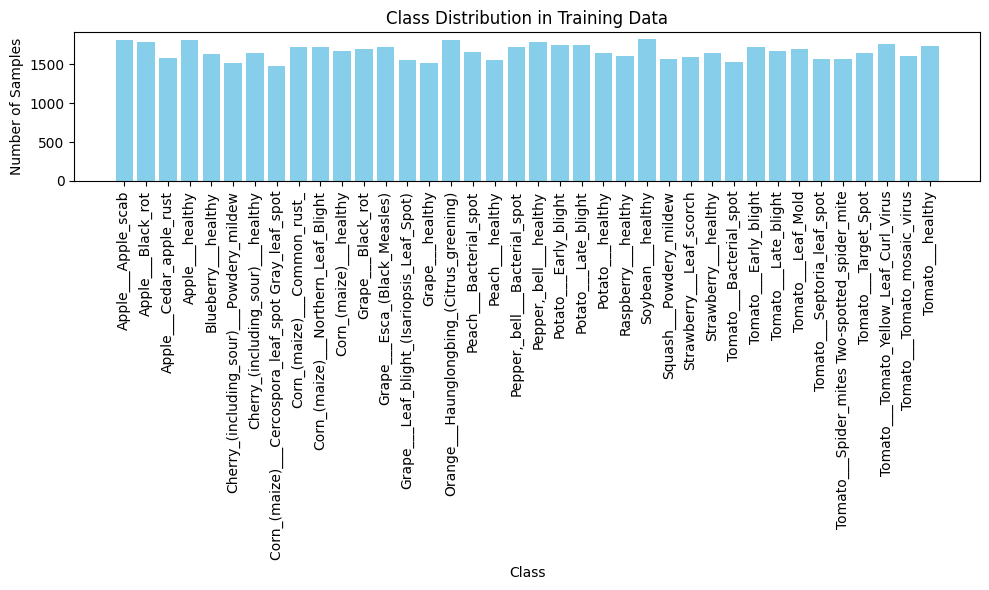

In [ ]:
class_labels = list(train_generator.class_indices.keys())
class_counts = np.bincount(train_generator.classes)

plt.figure(figsize=(10, 6))
plt.bar(class_labels, class_counts, color='skyblue')
plt.title('Class Distribution in Training Data')
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

* **Show a part of Train images**

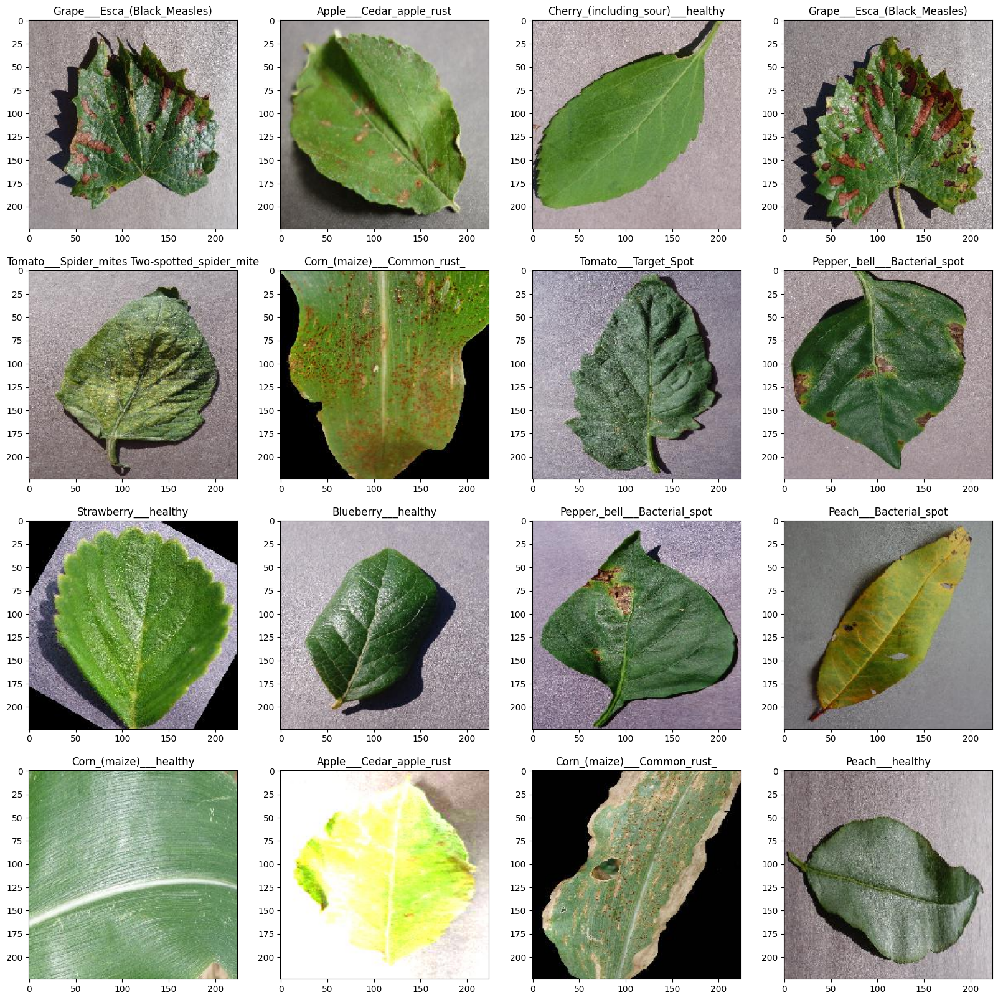

In [ ]:
classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    plt.show()
    break

* **Read Validation Data**

In [ ]:
valid_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    validation_split=0.1,
).flow_from_directory(train_dir,
                      batch_size=16,
                      target_size=(s,s),
                      subset='validation',
                      color_mode='rgb',
                      class_mode='categorical',
                      shuffle=False)

Found 7013 images belonging to 38 classes.


* **Show a part of Validation images**

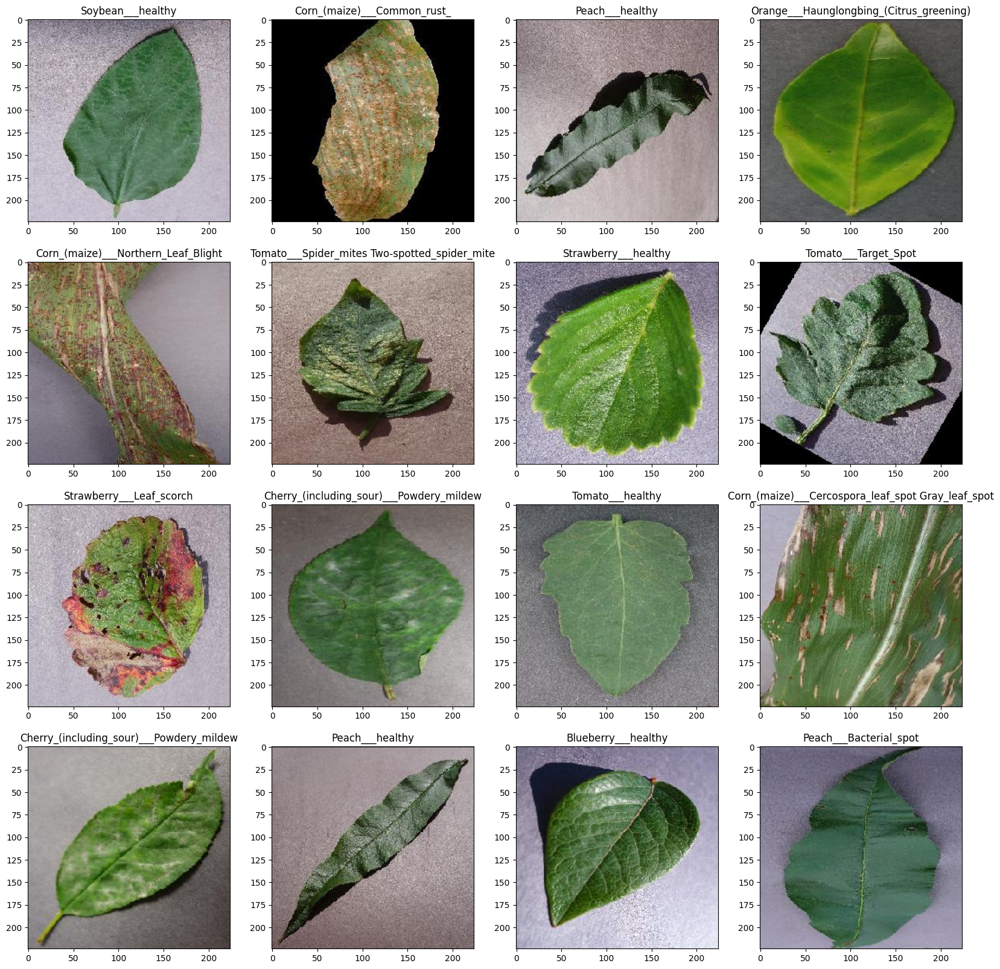

In [ ]:
classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    plt.show()
    break

* **Read Test Data**

In [ ]:
test_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
).flow_from_directory(test_dir,
                      batch_size=16,
                      target_size=(s,s),
                      color_mode='rgb',
                      class_mode='categorical',
                      shuffle=False)

Found 17572 images belonging to 38 classes.


* **Show a part of Test images**

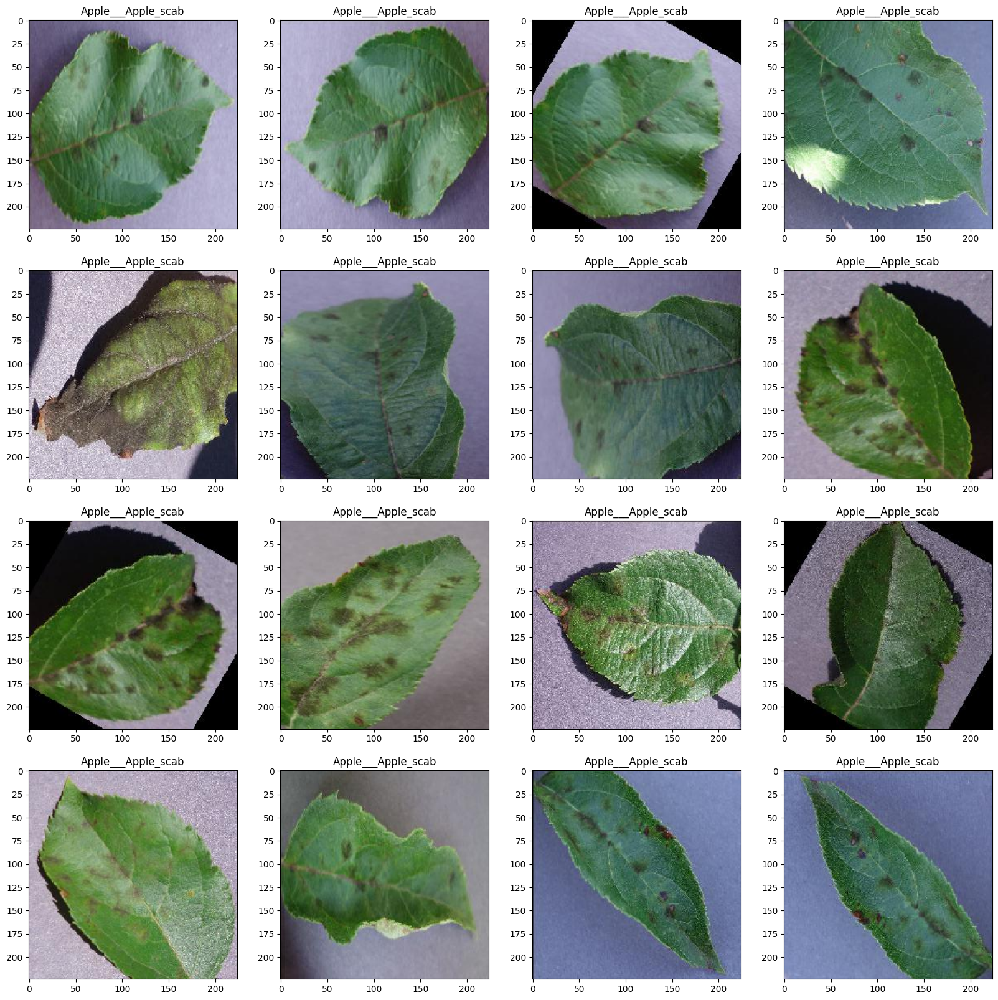

In [ ]:
classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in test_generator:
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    plt.show()
    break

# **Modeling**

## **A some of Funcation in model**

* **Funcation to calculate the evaluation of model**

In [ ]:
def Evaluate_model(model, train_generator, valid_generator, test_generator):
    model_evaluate_train = model.evaluate(train_generator)
    print("Loss of Train       : ",model_evaluate_train[0])
    print("Accuracy of Train   : ",model_evaluate_train[1])
    print("Precision of Train  : ",model_evaluate_train[2])
    print("Recall of Train     : ",model_evaluate_train[3])

    model_evaluate_valid = model.evaluate(valid_generator)
    print("Loss of Validation      : ",model_evaluate_valid[0])
    print("Accuracy of Validation  : ",model_evaluate_valid[1])
    print("Precision of Validation : ",model_evaluate_valid[2])
    print("Recall of Validation    : ",model_evaluate_valid[3])

    model_evaluate_test = model.evaluate(test_generator)
    print("Loss of Test      : ",model_evaluate_test[0])
    print("Accuracy of Test  : ",model_evaluate_test[1])
    print("Precision of Test : ",model_evaluate_test[2])
    print("Recall of Test    : ",model_evaluate_test[3])

    return np.round(model_evaluate_train[0], 2), np.round(model_evaluate_valid[0], 2), np.round(model_evaluate_test[0], 2), \
           np.round(model_evaluate_train[1], 2), np.round(model_evaluate_valid[1], 2), np.round(model_evaluate_test[1], 2), \
           np.round(model_evaluate_train[2], 2), np.round(model_evaluate_valid[2], 2), np.round(model_evaluate_test[2], 2), \
           np.round(model_evaluate_train[3], 2), np.round(model_evaluate_valid[3], 2), np.round(model_evaluate_test[3], 2)

* **Funcation to draw a some plots in model**

In [ ]:
def draw_plots(model):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    precision = history.history['precision']
    val_precision = history.history['val_precision']

    recall =history.history['recall']
    val_recall =history.history['val_recall']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    fig, ax = plt.subplots(2, 2, figsize=(17, 12))
    step = 2

    # Accuracy
    ax[0][0].plot(epochs, acc, color='green', label='Training Accuracy')
    ax[0][0].plot(epochs, val_acc, color='blue', label='Validation Accuracy')
    ax[0][0].set_title('Training and Validation Accuracy')
    ax[0][0].set_ylabel('Accuracy')
    ax[0][0].set_xlabel('Epoch')
    ax[0][0].legend()
    ax[0][0].set_xticks(np.arange(0, len(epochs) + step, step))
    ax[0][0].set_ylim(0, 1.02)

    # Precision
    ax[0][1].plot(epochs, precision, color='green', label='Training precision')
    ax[0][1].plot(epochs, val_precision, color='red', label='Validation precision')
    ax[0][1].set_title('Training and Validation precision')
    ax[0][1].set_xlabel('Epoch')
    ax[0][1].set_ylabel('precision')
    ax[0][1].legend()
    ax[0][1].set_xticks(np.arange(0, len(epochs) + step, step))
    ax[0][1].set_ylim(0,1.02)

    # Recall
    ax[1][0].plot(epochs, recall, color='green', label='Training Recall')
    ax[1][0].plot(epochs, val_recall, color='red', label='Validation Recall')
    ax[1][0].set_title('Training and Validation Recall')
    ax[1][0].set_xlabel('Epoch')
    ax[1][0].set_ylabel('Recall')
    ax[1][0].legend()
    ax[1][0].set_xticks(np.arange(0, len(epochs) + step, step))
    ax[1][0].set_ylim(0,1.02)

    # Loss
    ax[1][1].plot(epochs, loss, color='green', label='Training Loss')
    ax[1][1].plot(epochs, val_loss, color='red', label='Validation Loss')
    ax[1][1].set_title('Training and Validation Loss')
    ax[1][1].set_xlabel('Epoch')
    ax[1][1].set_ylabel('Loss')
    ax[1][1].legend()
    ax[1][1].set_xticks(np.arange(0, len(epochs) + step, step))

    plt.show()

* **Funcation to Pridect images**

In [ ]:
def Pridect_images (model, pred_dir, class_names):
    a=0
    for img in os.listdir(pred_dir):
        path = os.path.join(pred_dir, img)
        H,W,C = 224,224,3
        img = cv2.imread(path)
        img = cv2.resize(img, (H, W))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = np.array(img)
        img = img.astype("float32")
        img = img / 255.0
        plt.imshow(img)
        img = np.expand_dims(img, axis=0)
        prediction = np.argmax(model.predict(img),axis=-1)[0]
        plt.title(f"predict : {class_names[prediction]}")
        plt.show()
        a+=1
        if a==5:
            break

## **Normal CNN**

* **Build a structure of model**

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, Input
from keras.models import Model

input_shape = (224, 224, 3)
model_CNN = Sequential([
tf.keras.layers.Conv2D(128, (3,3), activation='relu', input_shape = input_shape,padding="same"),
tf.keras.layers.MaxPooling2D(2, 2),
tf.keras.layers.Conv2D(256, (3,3), activation='relu',padding="same"),
tf.keras.layers.MaxPooling2D(2,2),
tf.keras.layers.Conv2D(512, (3,3), activation='relu',padding="same"),
tf.keras.layers.MaxPooling2D(2,2),
tf.keras.layers.Conv2D(256, (3,3), activation='relu',padding="same"),
tf.keras.layers.MaxPooling2D(2,2),
tf.keras.layers.Flatten(),
tf.keras.layers.Dropout(0.5),
tf.keras.layers.Dense(1024, activation='relu'),
tf.keras.layers.Dropout(0.3),
tf.keras.layers.Dense(512, activation='relu'),
tf.keras.layers.Dropout(0.3),
tf.keras.layers.Dense(38, activation='softmax')
])

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999)

model_CNN.compile(optimizer= optimizer, loss="categorical_crossentropy", metrics=["accuracy",'precision','recall'])

model_CNN.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 128)  │         3,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 256)  │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │    51,381,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 38)             │        19,494 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 54,584,358 (208.22 MB)

 Trainable params: 54,584,358 (208.22 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

callbacks=[early_stopping,model_checkpoint]

* **Fit on Train Data**

In [ ]:
history = model_CNN.fit(train_generator,
                    epochs = 8,
                    batch_size=16,
                    validation_data = valid_generator,
                    callbacks = callbacks
                    )

Epoch 1/8


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1729714882.439540     193 service.cc:145] XLA service 0x7c8b8c004e70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729714882.439620     193 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


   2/3956 ━━━━━━━━━━━━━━━━━━━━ 4:52 74ms/step - accuracy: 0.0000e+00 - loss: 3.6763 - precision: 0.0000e+00 - recall: 0.0000e+00   

I0000 00:00:1729714896.249660     193 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3956/3956 ━━━━━━━━━━━━━━━━━━━━ 416s 101ms/step - accuracy: 0.4223 - loss: 2.0623 - precision: 0.7428 - recall: 0.3017 - val_accuracy: 0.9035 - val_loss: 0.3197 - val_precision: 0.9300 - val_recall: 0.8718
Epoch 2/8
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 294s 74ms/step - accuracy: 0.8776 - loss: 0.3857 - precision: 0.9110 - recall: 0.8474 - val_accuracy: 0.9183 - val_loss: 0.2508 - val_precision: 0.9378 - val_recall: 0.9025
Epoch 3/8
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 295s 74ms/step - accuracy: 0.9361 - loss: 0.1977 - precision: 0.9485 - recall: 0.9238 - val_accuracy: 0.9484 - val_loss: 0.1546 - val_precision: 0.9567 - val_recall: 0.9444
Epoch 4/8
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 295s 74ms/step - accuracy: 0.9578 - loss: 0.1272 - precision: 0.9645 - recall: 0.9521 - val_accuracy: 0.9538 - val_loss: 0.1435 - val_precision: 0.9603 - val_recall: 0.9480
Epoch 5/8
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 294s 74ms/step - accuracy: 0.9731 - loss: 0.0841 - precision: 0.9763 - recall: 0.9697 - val_accuracy: 0.9586 - v

* **Calculate a evalution model**

In [ ]:
Report_CNN = []
Report_CNN.append(Evaluate_model(model_CNN, train_generator, valid_generator, test_generator))
Report_CNN

3956/3956 ━━━━━━━━━━━━━━━━━━━━ 140s 35ms/step - accuracy: 0.9941 - loss: 0.0215 - precision: 0.9947 - recall: 0.9934
Loss of Train       :  0.02269298955798149
Accuracy of Train   :  0.9935368895530701
Precision of Train  :  0.9942083954811096
Recall of Train     :  0.9928415417671204
439/439 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - accuracy: 0.9679 - loss: 0.1005 - precision: 0.9721 - recall: 0.9643
Loss of Validation      :  0.13480907678604126
Accuracy of Validation  :  0.9586482048034668
Precision of Validation :  0.9638432860374451
Recall of Validation    :  0.9540852904319763
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 110s 100ms/step - accuracy: 0.9720 - loss: 0.0909 - precision: 0.9752 - recall: 0.9682
Loss of Test      :  0.10068555921316147
Accuracy of Test  :  0.967277467250824
Precision of Test :  0.9718714356422424
Recall of Test    :  0.963464617729187


[(0.02, 0.13, 0.1, 0.99, 0.96, 0.97, 0.99, 0.96, 0.97, 0.99, 0.95, 0.96)]

* **Draw a some plot**

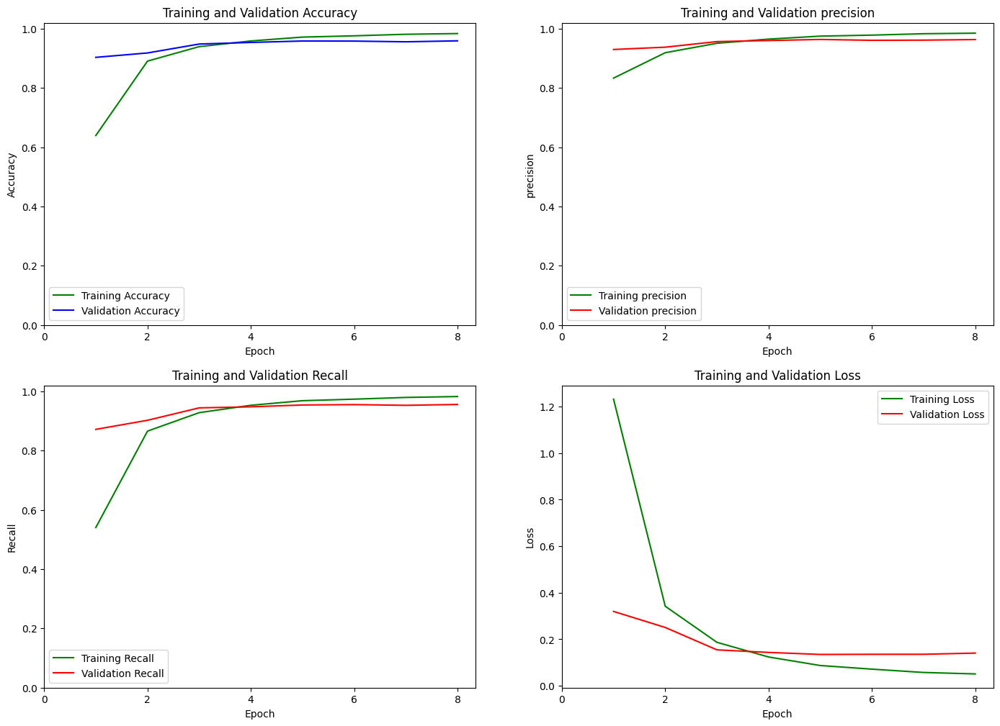

In [ ]:
draw_plots(model_CNN)

* **Confusion Matrix**

1099/1099 ━━━━━━━━━━━━━━━━━━━━ 42s 38ms/step
Classification report : 
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.98      0.94      0.96       504
                                 Apple___Black_rot       0.98      0.98      0.98       497
                          Apple___Cedar_apple_rust       0.97      0.99      0.98       440
                                   Apple___healthy       0.96      0.97      0.96       502
                               Blueberry___healthy       0.95      0.99      0.97       454
          Cherry_(including_sour)___Powdery_mildew       0.99      0.98      0.98       421
                 Cherry_(including_sour)___healthy       0.94      1.00      0.97       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.93      0.92      0.92       410
                       Corn_(maize)___Common_rust_       0.99      1.00      0.99       477
        

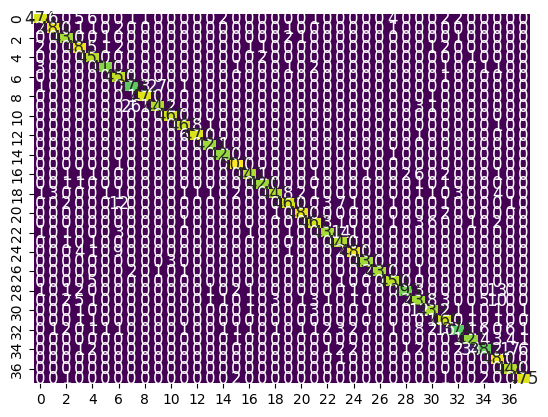

Normalized confusion matrix : 



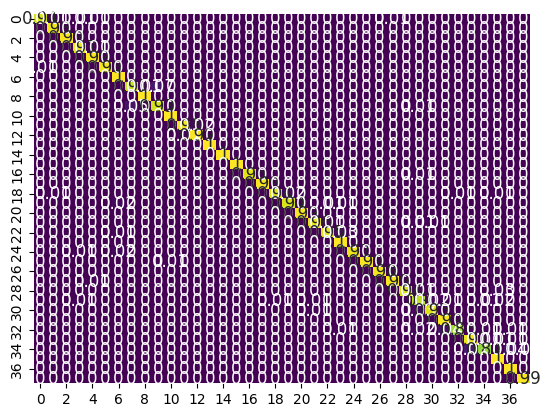

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

predictions = model_CNN.predict(test_generator)

y_pred = predictions.argmax(axis=-1)

class_names = list(test_generator.class_indices.keys())

print("Classification report : \n",classification_report(test_generator.labels, y_pred, target_names = class_names))

def draw_confusion_matrix(true, preds, normalize=None):
    conf_matx = confusion_matrix(true, preds, normalize = normalize)
    conf_matx = np.round(conf_matx, 2)

    sns.heatmap(conf_matx, annot=True, annot_kws={"size": 12},fmt="g", cbar=False, cmap="viridis")
    plt.show()

print("Confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred)

print("Normalized confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred, "true")

* **Save a model**

In [ ]:
model_CNN.save('/kaggle/working/Normal_CNN_Plant_Diseases.h5')

* **Load a model**

In [ ]:
model_CNN_load = tf.keras.models.load_model("/kaggle/working/Normal_CNN_Plant_Diseases.h5")

* **Predication on model**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


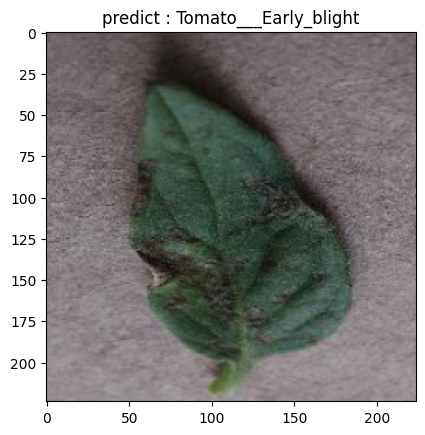

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


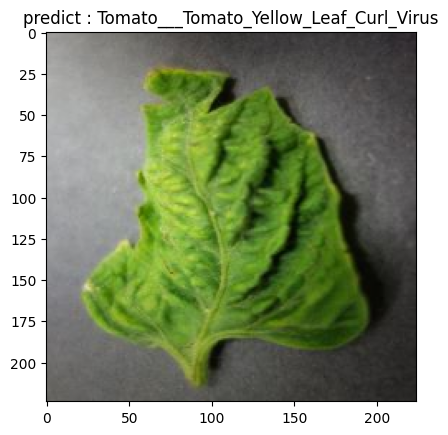

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


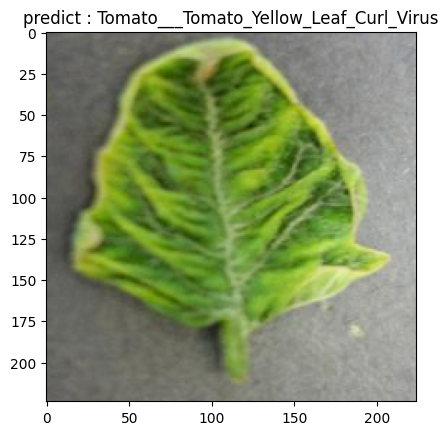

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


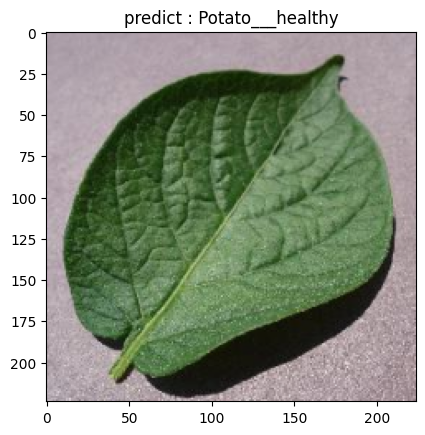

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


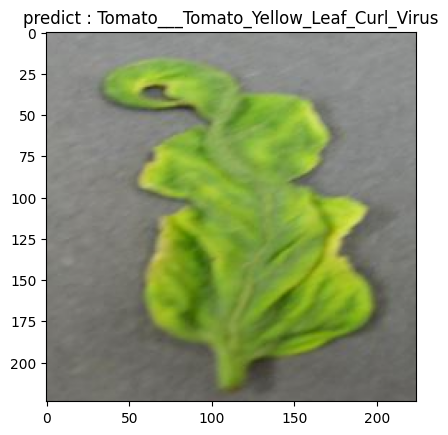

In [ ]:
pred_dir = '/kaggle/input/new-plant-diseases-dataset/test/test'
class_names = list(test_generator.class_indices.keys())
Pridect_images (model_CNN_load, pred_dir, class_names)

## **VGG19**

* **Build a structure of model**

In [ ]:
input_shape = (224, 224, 3)

inputs = tf.keras.Input(shape=input_shape)

base_model = tf.keras.applications.VGG19(include_top=False, weights='imagenet', input_tensor=inputs)

base_model.trainable = False

x = tf.keras.layers.Flatten()(base_model.output)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.3)(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.4)(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.5)(x)
outputs = tf.keras.layers.Dense(38, activation='softmax')(x)

model_VGG = tf.keras.models.Model(inputs = inputs, outputs = outputs)

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999)

model_VGG.compile(optimizer= optimizer, loss="categorical_crossentropy", metrics=["accuracy",'precision','recall'])

model_VGG.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │    12,845,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,04

 Total params: 33,042,662 (126.05 MB)

 Trainable params: 13,016,486 (49.65 MB)

 Non-trainable params: 20,026,176 (76.39 MB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

callbacks=[early_stopping,model_checkpoint]

* **Fit on Train Data**

In [ ]:
history = model_VGG.fit(train_generator,
                    epochs = 20,
                    batch_size=32,
                    validation_data = valid_generator,
                    callbacks = callbacks
                    )

Epoch 1/20
1946/3956 ━━━━━━━━━━━━━━━━━━━━ 1:38 49ms/step - accuracy: 0.2903 - loss: 2.8275 - precision: 0.5251 - recall: 0.1359

I0000 00:00:1729717975.279246     193 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_7', 4 bytes spill stores, 4 bytes spill loads



3956/3956 ━━━━━━━━━━━━━━━━━━━━ 226s 53ms/step - accuracy: 0.3961 - loss: 2.3236 - precision: 0.6419 - recall: 0.2294 - val_accuracy: 0.8759 - val_loss: 0.4382 - val_precision: 0.9421 - val_recall: 0.8121
Epoch 2/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 200s 51ms/step - accuracy: 0.7534 - loss: 0.8541 - precision: 0.8630 - recall: 0.6386 - val_accuracy: 0.9102 - val_loss: 0.3040 - val_precision: 0.9418 - val_recall: 0.8724
Epoch 3/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 198s 50ms/step - accuracy: 0.8207 - loss: 0.5980 - precision: 0.8903 - recall: 0.7552 - val_accuracy: 0.9144 - val_loss: 0.2659 - val_precision: 0.9389 - val_recall: 0.8903
Epoch 4/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 200s 50ms/step - accuracy: 0.8580 - loss: 0.4707 - precision: 0.9072 - recall: 0.8097 - val_accuracy: 0.9316 - val_loss: 0.2095 - val_precision: 0.9507 - val_recall: 0.9176
Epoch 5/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 201s 51ms/step - accuracy: 0.8797 - loss: 0.3911 - precision: 0.9170 - recall: 0.8439 - val_accuracy: 0.9383 

* **Calculate a evalution model**

In [ ]:
Report_VGG = []
Report_VGG.append(Evaluate_model(model_VGG, train_generator, valid_generator, test_generator))
Report_VGG

3956/3956 ━━━━━━━━━━━━━━━━━━━━ 174s 44ms/step - accuracy: 0.9942 - loss: 0.0179 - precision: 0.9946 - recall: 0.9936
Loss of Train       :  0.017672600224614143
Accuracy of Train   :  0.9946588277816772
Precision of Train  :  0.9951591491699219
Recall of Train     :  0.99405837059021
439/439 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - accuracy: 0.9746 - loss: 0.0855 - precision: 0.9772 - recall: 0.9728
Loss of Validation      :  0.16238932311534882
Accuracy of Validation  :  0.9525167346000671
Precision of Validation :  0.9593718647956848
Recall of Validation    :  0.9495223164558411
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 49s 44ms/step - accuracy: 0.9670 - loss: 0.1036 - precision: 0.9707 - recall: 0.9653
Loss of Test      :  0.15644903481006622
Accuracy of Test  :  0.9503756165504456
Precision of Test :  0.9563092589378357
Recall of Test    :  0.9466765522956848


[(0.02, 0.16, 0.16, 0.99, 0.95, 0.95, 1.0, 0.96, 0.96, 0.99, 0.95, 0.95)]

* **Draw a some plot**

In [ ]:
draw_plots(model_VGG)

* **Confusion Matrix**

1099/1099 ━━━━━━━━━━━━━━━━━━━━ 45s 41ms/step
Classification report : 
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.98      0.94      0.96       504
                                 Apple___Black_rot       0.99      0.99      0.99       497
                          Apple___Cedar_apple_rust       0.96      0.98      0.97       440
                                   Apple___healthy       0.96      0.96      0.96       502
                               Blueberry___healthy       0.96      0.99      0.98       454
          Cherry_(including_sour)___Powdery_mildew       0.99      1.00      0.99       421
                 Cherry_(including_sour)___healthy       0.98      0.99      0.99       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.92      0.92      0.92       410
                       Corn_(maize)___Common_rust_       0.99      1.00      0.99       477
        

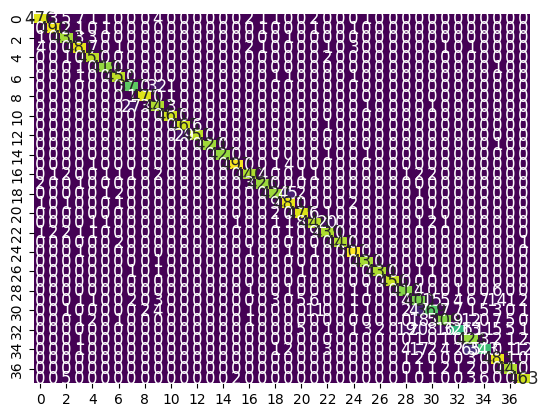

Normalized confusion matrix : 



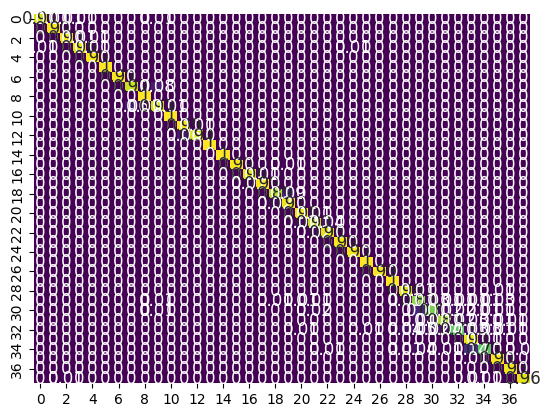

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

predictions = model_VGG.predict(test_generator)

y_pred = predictions.argmax(axis=-1)

class_names = list(test_generator.class_indices.keys())

print("Classification report : \n",classification_report(test_generator.labels, y_pred, target_names = class_names))

def draw_confusion_matrix(true, preds, normalize=None):
    conf_matx = confusion_matrix(true, preds, normalize = normalize)
    conf_matx = np.round(conf_matx, 2)

    sns.heatmap(conf_matx, annot=True, annot_kws={"size": 12},fmt="g", cbar=False, cmap="viridis")
    plt.show()

print("Confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred)

print("Normalized confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred, "true")

* **Save a model**

In [ ]:
model_VGG.save('/kaggle/working/VGG_Plant_Diseases.h5')

* **Load a model**

In [ ]:
model_VGG_load = tf.keras.models.load_model("/kaggle/working/VGG_Plant_Diseases.h5")

* **Predication on model**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


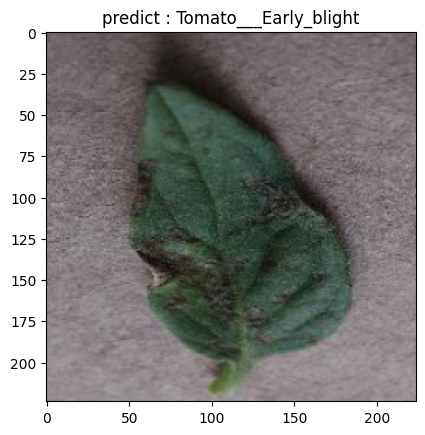

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


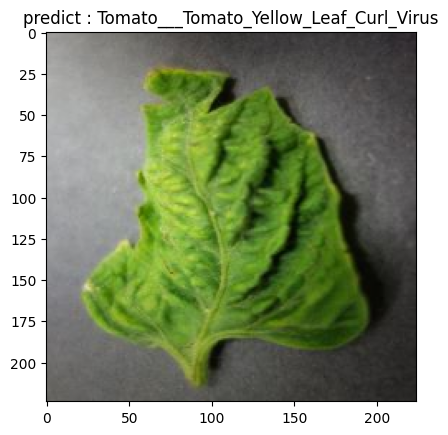

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


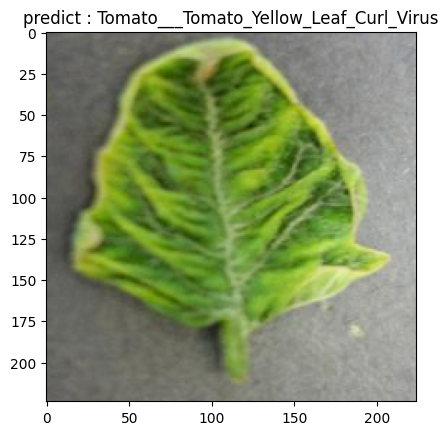

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


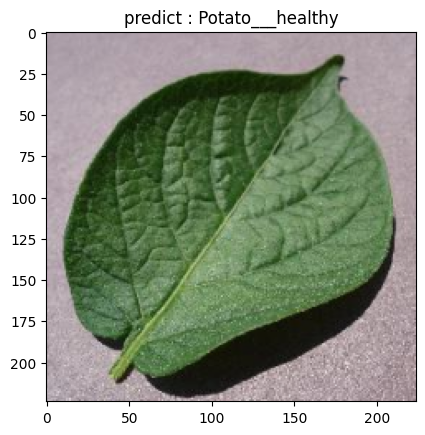

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


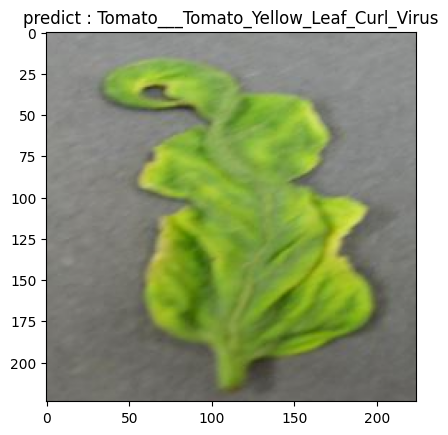

In [ ]:
pred_dir = '/kaggle/input/new-plant-diseases-dataset/test/test'
class_names = list(test_generator.class_indices.keys())
Pridect_images (model_VGG_load, pred_dir, class_names)

## **DenseNet201**

* **Build a structure of model**

In [ ]:
input_shape = (224, 224, 3)

inputs = tf.keras.Input(shape=input_shape)

base_model = tf.keras.applications.DenseNet201(include_top=False, weights='imagenet', input_tensor=inputs)

base_model.trainable = False

x = tf.keras.layers.Flatten()(base_model.output)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.4)(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.3)(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(38, activation='softmax')(x)

model_DenseNet = tf.keras.models.Model(inputs = inputs, outputs = outputs)

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

model_DenseNet.compile(optimizer= optimizer, loss="categorical_crossentropy", metrics=["accuracy",'precision','recall'])

model_DenseNet.summary()

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 230, 230,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 66,664,166 (254.30 MB)

 Trainable params: 48,340,390 (184.40 MB)

 Non-trainable params: 18,323,776 (69.90 MB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=15, min_lr=0.000001)

callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]

* **Fit on Train Data**

In [ ]:
history = model_DenseNet.fit(train_generator,
                           epochs = 10,
                           batch_size=32,
                           validation_data = valid_generator,
                           callbacks = callbacks
                           )

Epoch 1/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 367s 81ms/step - accuracy: 0.7272 - loss: 0.9577 - precision: 0.8670 - recall: 0.6260 - val_accuracy: 0.9477 - val_loss: 0.1573 - val_precision: 0.9591 - val_recall: 0.9393 - learning_rate: 0.0010
Epoch 2/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 279s 70ms/step - accuracy: 0.9132 - loss: 0.2673 - precision: 0.9327 - recall: 0.8966 - val_accuracy: 0.9589 - val_loss: 0.1389 - val_precision: 0.9652 - val_recall: 0.9538 - learning_rate: 0.0010
Epoch 3/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 281s 71ms/step - accuracy: 0.9396 - loss: 0.1870 - precision: 0.9514 - recall: 0.9292 - val_accuracy: 0.9629 - val_loss: 0.1170 - val_precision: 0.9674 - val_recall: 0.9594 - learning_rate: 0.0010
Epoch 4/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 282s 71ms/step - accuracy: 0.9526 - loss: 0.1440 - precision: 0.9604 - recall: 0.9461 - val_accuracy: 0.9666 - val_loss: 0.1109 - val_precision: 0.9689 - val_recall: 0.9648 - learning_rate: 0.0010
Epoch 5/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 28

* **Calculate a evalution model**

In [ ]:
Report_DenseNet = []
Report_DenseNet.append(Evaluate_model(model_DenseNet, train_generator, valid_generator, test_generator))
Report_DenseNet

3956/3956 ━━━━━━━━━━━━━━━━━━━━ 244s 62ms/step - accuracy: 0.9946 - loss: 0.0515 - precision: 0.9950 - recall: 0.9944
Loss of Train       :  0.06814338266849518
Accuracy of Train   :  0.994437575340271
Precision of Train  :  0.9948135018348694
Recall of Train     :  0.9941689372062683
439/439 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - accuracy: 0.9804 - loss: 0.0758 - precision: 0.9813 - recall: 0.9798
Loss of Validation      :  0.09989415109157562
Accuracy of Validation  :  0.972622275352478
Precision of Validation :  0.9741243720054626
Recall of Validation    :  0.9716241359710693
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 128s 116ms/step - accuracy: 0.9822 - loss: 0.0718 - precision: 0.9830 - recall: 0.9810
Loss of Test      :  0.08512913435697556
Accuracy of Test  :  0.9758138060569763
Precision of Test :  0.9777206778526306
Recall of Test    :  0.9739927053451538


[(0.07, 0.1, 0.09, 0.99, 0.97, 0.98, 0.99, 0.97, 0.98, 0.99, 0.97, 0.97)]

* **Draw a some plot**

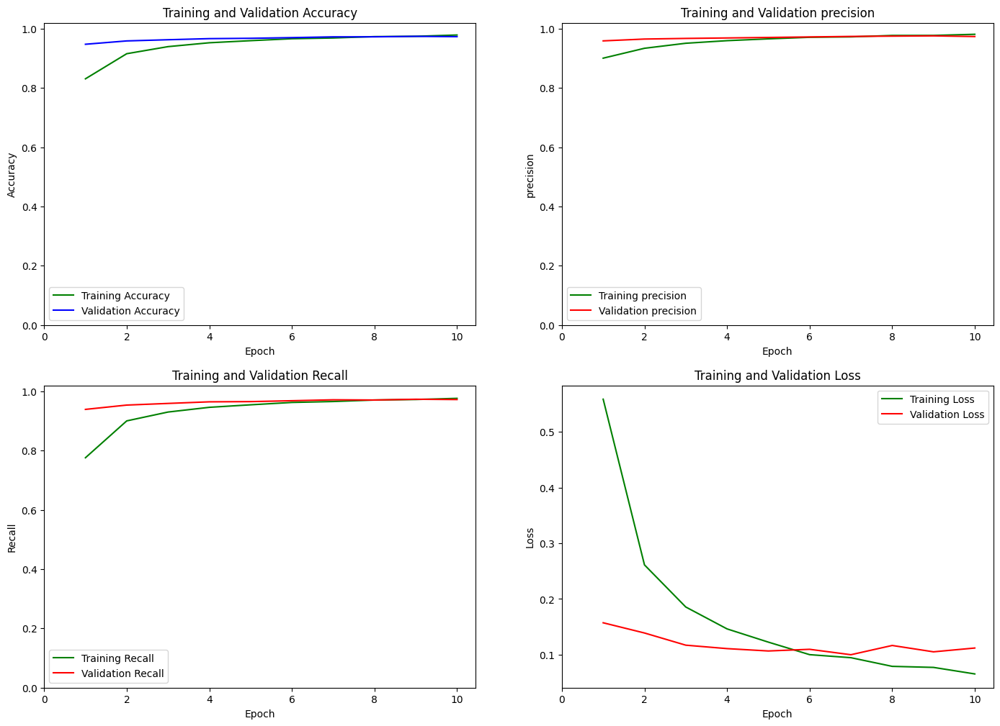

In [ ]:
draw_plots(model_DenseNet)

* **Confusion Matrix**

1099/1099 ━━━━━━━━━━━━━━━━━━━━ 107s 81ms/step
Classification report : 
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.97      0.99      0.98       504
                                 Apple___Black_rot       0.99      0.99      0.99       497
                          Apple___Cedar_apple_rust       0.99      1.00      1.00       440
                                   Apple___healthy       1.00      0.95      0.97       502
                               Blueberry___healthy       0.98      0.99      0.98       454
          Cherry_(including_sour)___Powdery_mildew       0.97      1.00      0.99       421
                 Cherry_(including_sour)___healthy       1.00      1.00      1.00       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.91      0.94      0.93       410
                       Corn_(maize)___Common_rust_       0.99      1.00      0.99       477
       

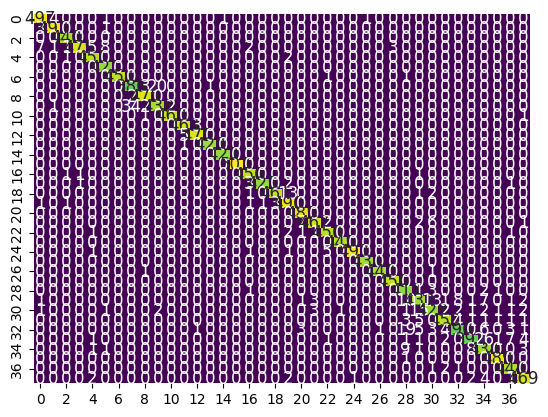

Normalized confusion matrix : 



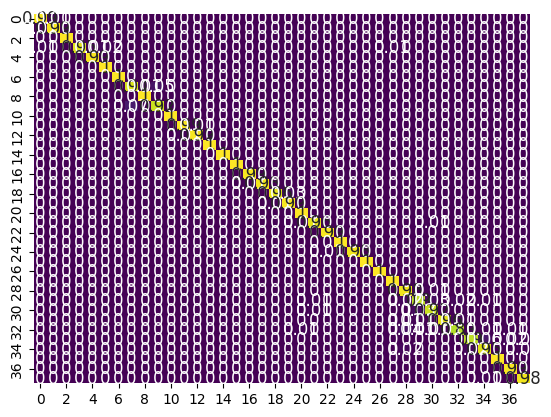

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

predictions = model_DenseNet.predict(test_generator)

y_pred = predictions.argmax(axis=-1)

class_names = list(test_generator.class_indices.keys())

print("Classification report : \n",classification_report(test_generator.labels, y_pred, target_names = class_names))

def draw_confusion_matrix(true, preds, normalize=None):
    conf_matx = confusion_matrix(true, preds, normalize = normalize)
    conf_matx = np.round(conf_matx, 2)

    sns.heatmap(conf_matx, annot=True, annot_kws={"size": 12},fmt="g", cbar=False, cmap="viridis")
    plt.show()

print("Confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred)

print("Normalized confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred, "true")

* **Save a model**

In [ ]:
model_DenseNet.save('/kaggle/working/DenseNet_Plant_Diseases.h5')

* **Load a model**

In [ ]:
model_DenseNet_load = tf.keras.models.load_model("/kaggle/working/DenseNet_Plant_Diseases.h5")

* **Predication on model**

1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step


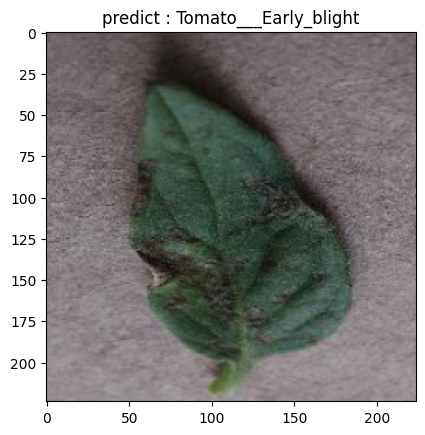

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


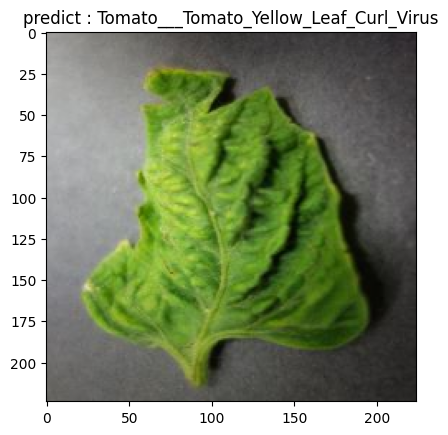

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


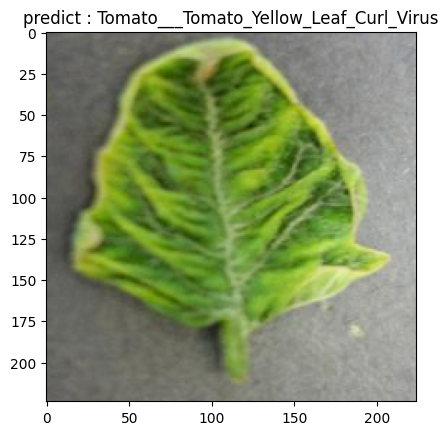

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


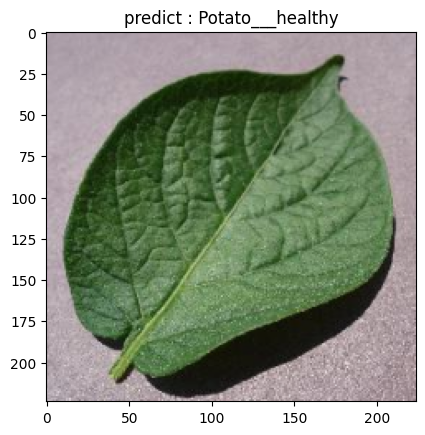

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


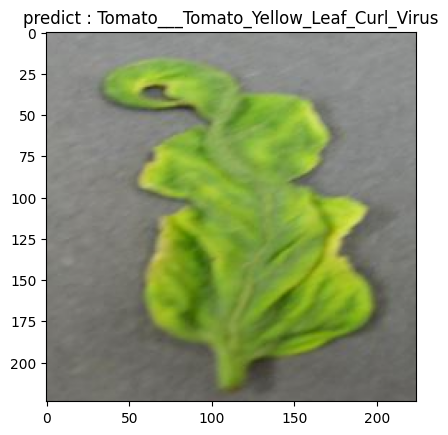

In [ ]:
pred_dir = '/kaggle/input/new-plant-diseases-dataset/test/test'
class_names = list(test_generator.class_indices.keys())
Pridect_images (model_DenseNet_load, pred_dir, class_names)

## **Build a DataFrame to show all accuracy of all models**

In [ ]:
data = [
    list(Report_CNN[0]),
    list(Report_VGG[0]),
    list(Report_DenseNet[0])

]

columns = ['Loss Train', 'Loss Valid', 'Loss Test', 'Accuracy Train', 'Accuracy Valid', 'Accuracy Test', 'Precision Train', 'Precision Valid', 'Precision Test', 'Recall Train', 'Recall Valid', 'Recall Test']

df = pd.DataFrame(data, columns=columns)
df.index = ['Normal CNN', 'VGG19', 'DenseNet201']
df

,Loss Train,Loss Valid,Loss Test,Accuracy Train,Accuracy Valid,Accuracy Test,Precision Train,Precision Valid,Precision Test,Recall Train,Recall Valid,Recall Test
Normal CNN,0.02,0.13,0.10,0.99,0.96,0.97,0.99,0.96,0.97,0.99,0.95,0.96
VGG19,0.02,0.16,0.16,0.99,0.95,0.95,1.00,0.96,0.96,0.99,0.95,0.95
DenseNet201,0.07,0.10,0.09,0.99,0.97,0.98,0.99,0.97,0.98,0.99,0.97,0.97


In [ ]:
df.to_csv('DataFrame_Plant_Diseases.csv')